In [1]:
import os
import sys
import re
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
from pandas import Series,DataFrame
import seaborn as sns
import palettable #python颜色库
from sklearn import datasets 

src_path = r"D:\Codes\GIthub_repo\Energy_grid\data\UCSD_raw_data"

'''
fn_list=os.listdir(src_path)
fn_list
fn_list_bld=list()
fn_list_pv=list()

#get the bld and pv file list
for i in fn_list:
    bld="^BLD_.*"
    pv='^PV_.*'
    if re.match(bld, i):
        fn_list_bld.append(i)
    elif re.match(pv,i):
        fn_list_pv.append(i)
'''
fn_list_bld=[
 'BLD_CenterHall.csv',
 'BLD_EastCampus.csv',
 'BLD_GalbraithHall.csv',
 'BLD_GeiselLibrary.csv',
 'BLD_Gilman.csv',
 'BLD_Hopkins.csv',
 'BLD_Mandeville.csv',
 'BLD_MusicBuilding.csv',
 'BLD_OttersonHall.csv',
 'BLD_PepperCanyon.csv',
 'BLD_PoliceDepartment.csv',
 'BLD_RadyHall.csv',
 'BLD_RobinsonHall.csv',
 'BLD_SocialScience.csv',
 'BLD_StudentServices.csv']

fn_list_pv=[
 'PV_BSB-Building.csv',
 'PV_BSB-Library.csv',
 'PV_CSC-Building.csv',
 'PV_CUP.csv',
 'PV_EBU2_A.csv',
 'PV_EBU2_B.csv',
 'PV_ElectricShop.csv',
 'PV_GarageFleets.csv',
 'PV_Gilman.csv',
 'PV_Hopkins.csv',
 'PV_KeelingA.csv',
 'PV_KeelingB.csv',
 'PV_KyoceraSkyline.csv',
 'PV_Leichtag.csv',
 'PV_MayerHall.csv',
 'PV_MESOM.csv',
 'PV_OslerParking.csv',
 'PV_Powell.csv',
 'PV_PriceCenterA.csv',
 'PV_PriceCenterB.csv',
 'PV_SDSC.csv',
 'PV_SME_Solar.csv',
 'PV_StephenBirch.csv']


In [ ]:
def intersection_sum(fn_list,src_path,key,save_fn,interpolate):
    #read all csv files in the list as a list of dataframe
    dataframes=[]
    for i in fn_list:
        fn=src_path+'\\'+i
        df=pd.read_csv(fn)
        #turn the datetime row into type(DateTime)
        df['DateTime']=pd.to_datetime(df['DateTime'])
        df=df.loc[df['DateTime']>'31-12-2016'].copy()
        #if specified to interpolate
        if(interpolate):
            helper=pd.DataFrame({'DateTime':pd.date_range(start=df['DateTime'].min(),
                                                          end=df['DateTime'].max(),freq='900s')})
            df=pd.merge(df,helper,on='DateTime',how='outer').sort_values("DateTime")
            df[key]=df[key].interpolate(method ='linear')
        print(df.info())
        df['DateTime']=pd.to_datetime(df['DateTime'])
        df=df.set_index('DateTime').copy()
        dataframes.append(df)
    
    
    #get intersection of datetime of all sub dataframes
    common_datetime=set(dataframes[0].index)
    for df in dataframes[1:]:
        common_datetime=common_datetime.intersection(df.index)
        print('Progress notification: getting intersections')
    #print(common_datetime)
    

    
    print(dataframes[0].index)
    
    #Create a new empty dataframe   
    combined_df=pd.DataFrame(columns=['DateTime',key])
    #sum=pd.merge(dataframes[0],combined_df)
    
    #print("process notification")
    #Iterate over the common datetime index
    for dt in common_datetime:
        data_sum = 0
        i=0
        for df in dataframes:
            #row = df[df['DateTime'] == dt]
            #if not row.empty:
                #data_sum += row[key].values[0]
            try:
                value=df.loc[dt,key]
                if value!=None:
                    data_sum+=value
            except:
                print('skipped:'+str(dt))
                pass
            
        data={'DateTime': [dt], key: [data_sum]}
        add_row=pd.DataFrame(data=data)
        # Add the combined row to the new dataframe
        #print("process notification: getting the sum")
        combined_df = pd.concat([combined_df,add_row], ignore_index=True)
    #print("process notification")
    combined_df=combined_df.sort_values(by=["DateTime"],ignore_index=True)
    combined_df.to_csv(save_fn,index=False)


In [ ]:
# To visualize the datacount of different source


def visual_data_count(fn_list,src_path,fig_title,fig_save_path):
    
    #Load data from fn_list
    #count values and group by month
    dataframes_bld_count=[]
    for i in fn_list:
        fn=src_path+'\\'+i
        df=pd.read_csv(fn)
        df['DateTime']=pd.to_datetime(df['DateTime'])
        df['Year_n_Month']=df['DateTime'].dt.year.map(str)+"_"+df["DateTime"].dt.month.map(str)
        df=df.drop(columns=["DateTime","ReactivePower"],errors='ignore')
        df_count=df.groupby("Year_n_Month").agg('count')
        splited_i=re.split(r'(_|\.)',i)
        df_count=df_count.rename(columns={"RealPower":splited_i[2]})
        dataframes_bld_count.append(df_count)
        
    #merge meta dataframes
    merged_df=dataframes_bld_count[0]
    for df in dataframes_bld_count[1:]:
        merged_df=pd.concat([merged_df,df],axis=1)
        merged_df.fillna(0,inplace=True)  
        
    #reindex as datetime for sorting  
    merged_df.index = pd.to_datetime(merged_df.index, format='%Y_%m')
    sorted_df=merged_df.sort_index()
    
    #reindex as str and truncate YYYY-MM
    sorted_df.index=sorted_df.index.astype(str).str[:7]
    
    #turn into matrix and sum by row
    sorted_df=sorted_df.T
    sorted_df['Sum']=sorted_df.apply(lambda x:x.sum(),axis=1)
    
    #sort by sum
    sorted_df.sort_values(by='Sum',inplace=True)

    #plot
    plt.figure(dpi=200,figsize=[24,8])
    sns.heatmap(data=sorted_df.drop(columns=['Sum']))
    plt.title(fig_title,fontsize=20)
    plt.xticks(rotation=45)
    plt.yticks(rotation=0)
    plt.savefig(fig_save_path,format="png")

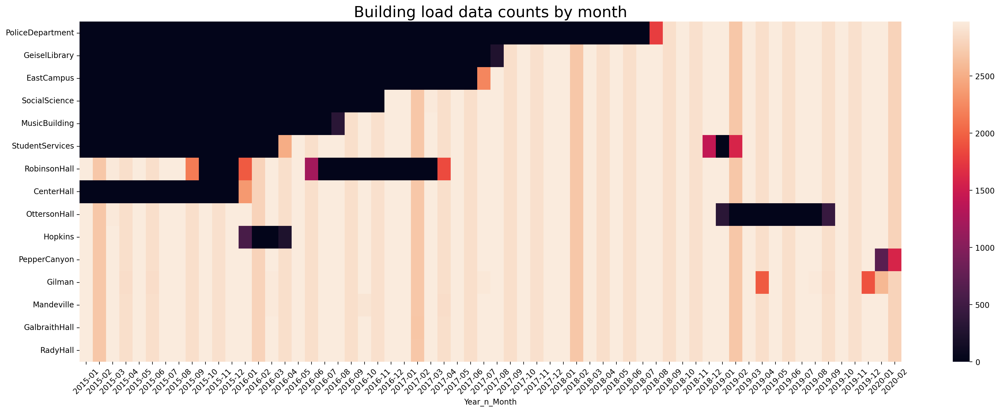

In [ ]:
visual_data_count(fn_list_bld,src_path,"Building load data counts by month","../figures/bld_load_data_count.png")

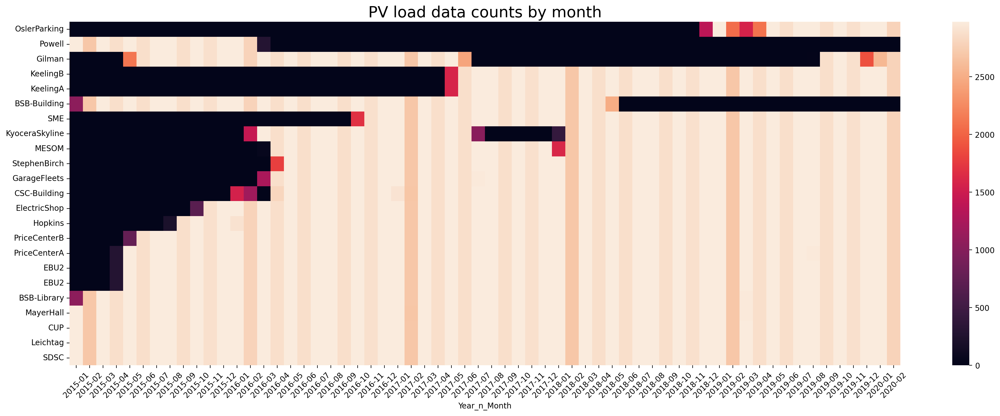

In [ ]:
visual_data_count(fn_list_pv,src_path,"PV load data counts by month","../figures/pv_load_data_count.png")

# to get the max intersection of pv whose records are relatively complete from 2017-01-01 to 2019-12-31

In [ ]:
max_intersection={
    'bld_fn_list':['BLD_GalbraithHall.csv',
                   'BLD_RadyHall.csv',
                   'BLD_Mandeville.csv'],
    'pv_fn_list':['PV_SME_Solar.csv',
                  'PV_StephenBirch.csv',
                  'PV_GarageFleets.csv',
                  'PV_CSC-Building.csv',
                  'PV_ElectricShop.csv',
                  'PV_Hopkins.csv',
                  'PV_PriceCenterA.csv',
                  'PV_PriceCenterB.csv',
                  'PV_EBU2_A.csv',
                  'PV_EBU2_B.csv',
                  'PV_BSB-Library.csv',
                  'PV_MayerHall.csv',
                  'PV_CUP.csv',
                  'PV_Leichtag.csv',
                  'PV_SDSC.csv'],
    'prefix':'max_intersection_3y'
}
intersection_sum(max_intersection['pv_fn_list'],
                 src_path,
                 "RealPower",
                 "../data/UCSD_raw_data/"+max_intersection['prefix']+"PV_ALL_temp.csv",
                 True)


# to get the sum of the xgb prediction of blds old version

In [ ]:
max_intersection={
    'bld_fn_list':[
                #'CenterHall',# deleted
                #'EastCampus',# deleted
                'BLD_GalbraithHall_XGBoost_prediction.csv',
                #'GeiselLibrary',# deleted
                #'Gilman',# missing of test sets
                'BLD_Hopkins_XGBoost_prediction.csv',
                'BLD_Mandeville_XGBoost_prediction.csv',
                'BLD_MusicBuilding_XGBoost_prediction.csv',
                #'OttersonHall',# missing of test sets
                #'PepperCanyon',# missing of test sets
                #'PoliceDepartment', deleted
                'BLD_RadyHall_XGBoost_prediction.csv',
                'BLD_RobinsonHall_XGBoost_prediction.csv',
                'BLD_SocialScience_XGBoost_prediction.csv',
                #'StudentServices' deleted
                ],
    'pv_fn_list':['PV_SME_Solar.csv',
                  'PV_StephenBirch.csv',
                  'PV_GarageFleets.csv',
                  'PV_CSC-Building.csv',
                  'PV_ElectricShop.csv',
                  'PV_Hopkins.csv',
                  'PV_PriceCenterA.csv',
                  'PV_PriceCenterB.csv',
                  'PV_EBU2_A.csv',
                  'PV_EBU2_B.csv',
                  'PV_BSB-Library.csv',
                  'PV_MayerHall.csv',
                  'PV_CUP.csv',
                  'PV_Leichtag.csv',
                  'PV_SDSC.csv'],
    'prefix':'sum_bld_real'
}
intersection_sum(max_intersection['bld_fn_list'],
                 'D:/Codes/GIthub_repo/Energy_grid/data/load_forecast/seperated',
                 "RealPower",
                 "../data/load_forecast/"+max_intersection['prefix']+".csv",
                 True)

                 DateTime  RealPower  RealPower_pred
0     2019-01-01 00:00:00    121.242      117.390890
1     2019-01-01 00:15:00    115.773      112.217230
2     2019-01-01 00:30:00    113.093      113.070470
3     2019-01-01 00:45:00    111.401      109.591515
4     2019-01-01 01:00:00    116.448      108.845930
...                   ...        ...             ...
35031 2019-12-31 22:45:00    106.494      112.629890
35032 2019-12-31 23:00:00    106.751      107.357640
35033 2019-12-31 23:15:00    105.143      106.195050
35034 2019-12-31 23:30:00    103.495      107.527890
35035 2019-12-31 23:45:00    104.864      108.078190

[35040 rows x 3 columns]
{Timestamp('2019-02-19 08:45:00'), Timestamp('2019-10-06 08:45:00'), Timestamp('2019-05-12 11:00:00'), Timestamp('2019-07-19 21:30:00'), Timestamp('2019-10-28 10:00:00'), Timestamp('2019-12-28 21:00:00'), Timestamp('2019-10-13 02:15:00'), Timestamp('2019-06-05 03:30:00'), Timestamp('2019-05-21 05:00:00'), Timestamp('2019-11-25 17:15:00'

# to get the sum of the xgb prediction of blds refitted version

In [ ]:
max_intersection={
    'bld_fn_list':[
                #'CenterHall',# deleted
                #'EastCampus',# deleted
                'BLD_GalbraithHall_XGBoost_prediction.csv',
                #'GeiselLibrary',# deleted
                #'Gilman',# missing of test sets
                'BLD_Hopkins_XGBoost_prediction.csv',
                'BLD_Mandeville_XGBoost_prediction.csv',
                'BLD_MusicBuilding_XGBoost_prediction.csv',
                #'OttersonHall',# missing of test sets
                #'PepperCanyon',# missing of test sets
                #'PoliceDepartment', deleted
                'BLD_RadyHall_XGBoost_prediction.csv',
                'BLD_RobinsonHall_XGBoost_prediction.csv',
                'BLD_SocialScience_XGBoost_prediction.csv',
                #'StudentServices' deleted
                ],
    'pv_fn_list':['PV_SME_Solar.csv',
                  'PV_StephenBirch.csv',
                  'PV_GarageFleets.csv',
                  'PV_CSC-Building.csv',
                  'PV_ElectricShop.csv',
                  'PV_Hopkins.csv',
                  'PV_PriceCenterA.csv',
                  'PV_PriceCenterB.csv',
                  'PV_EBU2_A.csv',
                  'PV_EBU2_B.csv',
                  'PV_BSB-Library.csv',
                  'PV_MayerHall.csv',
                  'PV_CUP.csv',
                  'PV_Leichtag.csv',
                  'PV_SDSC.csv'],
    'prefix':'sum_bld_pred'
}
intersection_sum(max_intersection['bld_fn_list'],
                 'D:/Codes/GIthub_repo/Energy_grid/data/load_forecast/Simple/bld_seperated',
                 "RealPower_pred",
                 "../data/load_forecast/Simple/"+max_intersection['prefix']+".csv",
                 True)

# to get the sum of the simple prediction of blds refitted version

In [ ]:
max_intersection={
    'bld_fn_list':[
                #'CenterHall',# deleted
                #'EastCampus',# deleted
                'BLD_GalbraithHallSimple_pred.csv',
                #'GeiselLibrary',# deleted
                #'Gilman',# missing of test sets
                'BLD_HopkinsSimple_pred.csv',
                'BLD_MandevilleSimple_pred.csv',
                'BLD_MusicBuildingSimple_pred.csv',
                #'OttersonHall',# missing of test sets
                #'PepperCanyon',# missing of test sets
                #'PoliceDepartment', deleted
                'BLD_RadyHallSimple_pred.csv',
                'BLD_RobinsonHallSimple_pred.csv',
                'BLD_SocialScienceSimple_pred.csv',
                #'StudentServices' deleted
                ],
    'pv_fn_list':['PV_SME_Solar.csv',
                  'PV_StephenBirch.csv',
                  'PV_GarageFleets.csv',
                  'PV_CSC-Building.csv',
                  'PV_ElectricShop.csv',
                  'PV_Hopkins.csv',
                  'PV_PriceCenterA.csv',
                  'PV_PriceCenterB.csv',
                  'PV_EBU2_A.csv',
                  'PV_EBU2_B.csv',
                  'PV_BSB-Library.csv',
                  'PV_MayerHall.csv',
                  'PV_CUP.csv',
                  'PV_Leichtag.csv',
                  'PV_SDSC.csv'],
    'prefix':'sum_bld_real'
}
intersection_sum(max_intersection['bld_fn_list'],
                 'D:/Codes/GIthub_repo/Energy_grid/data/load_forecast/Simple/bld_seperated',
                 "RealPower",
                 "../data/load_forecast/Simple/"+max_intersection['prefix']+".csv",
                 True)

       Unnamed: 0            DateTime  RealPower  RealPower_pred   
0               0 2019-01-01 00:00:00    121.242             NaN  \
1               1 2019-01-01 00:15:00    115.773             NaN   
2               2 2019-01-01 00:30:00    113.093             NaN   
3               3 2019-01-01 00:45:00    111.401             NaN   
4               4 2019-01-01 01:00:00    116.448             NaN   
...           ...                 ...        ...             ...   
35039       35039 2019-12-31 22:45:00    106.494      111.626099   
35040       35040 2019-12-31 23:00:00    106.751      111.044855   
35041       35041 2019-12-31 23:15:00    105.143      109.812597   
35042       35042 2019-12-31 23:30:00    103.495             NaN   
35043       35043 2019-12-31 23:45:00    104.864             NaN   

       historical_ave  pred_error  
0                 NaN         NaN  
1                 NaN         NaN  
2                 NaN         NaN  
3                 NaN         NaN  
4  

# to get the sum original of 7 blds 

In [ ]:
max_intersection={
    'bld_fn_list':[
                #'CenterHall',# deleted
                #'EastCampus',# deleted
                'BLD_GalbraithHall.csv',
                #'GeiselLibrary',# deleted
                #'Gilman',# missing of test sets
                'BLD_Hopkins.csv',
                'BLD_Mandeville.csv',
                'BLD_MusicBuilding.csv',
                #'OttersonHall',# missing of test sets
                #'PepperCanyon',# missing of test sets
                #'PoliceDepartment', deleted
                'BLD_RadyHall.csv',
                'BLD_RobinsonHall.csv',
                'BLD_SocialScience.csv',
                #'StudentServices' deleted
                ],
    'pv_fn_list':['PV_SME_Solar.csv',
                  'PV_StephenBirch.csv',
                  'PV_GarageFleets.csv',
                  'PV_CSC-Building.csv',
                  'PV_ElectricShop.csv',
                  'PV_Hopkins.csv',
                  'PV_PriceCenterA.csv',
                  'PV_PriceCenterB.csv',
                  'PV_EBU2_A.csv',
                  'PV_EBU2_B.csv',
                  'PV_BSB-Library.csv',
                  'PV_MayerHall.csv',
                  'PV_CUP.csv',
                  'PV_Leichtag.csv',
                  'PV_SDSC.csv'],
    'prefix':'sum_bld_real'
}
intersection_sum(max_intersection['bld_fn_list'],
                 'D:/Codes/GIthub_repo/Energy_grid/data/UCSD_raw_data',
                 "RealPower",
                 "../data/UCSD_raw_data/"+max_intersection['prefix']+".csv",
                 True)

<class 'pandas.core.frame.DataFrame'>
Index: 110987 entries, 110964 to 0
Data columns (total 3 columns):
 #   Column         Non-Null Count   Dtype         
---  ------         --------------   -----         
 0   DateTime       110987 non-null  datetime64[ns]
 1   RealPower      110987 non-null  float64       
 2   ReactivePower  110965 non-null  float64       
dtypes: datetime64[ns](1), float64(2)
memory usage: 3.4 MB
None
<class 'pandas.core.frame.DataFrame'>
Index: 110987 entries, 110950 to 0
Data columns (total 3 columns):
 #   Column         Non-Null Count   Dtype         
---  ------         --------------   -----         
 0   DateTime       110987 non-null  datetime64[ns]
 1   RealPower      110987 non-null  float64       
 2   ReactivePower  110951 non-null  float64       
dtypes: datetime64[ns](1), float64(2)
memory usage: 3.4 MB
None
<class 'pandas.core.frame.DataFrame'>
Index: 110987 entries, 110943 to 0
Data columns (total 3 columns):
 #   Column         Non-Null Count   

# to visualize the data count

In [2]:
fn=src_path+'\\'+fn_list_bld[0]
df=pd.read_csv(fn)
df['DateTime']=pd.to_datetime(df['DateTime'])

df['Year_n_Month']=df['DateTime'].dt.year.map(str)+"_"+df["DateTime"].dt.month.map(str)
df=df.drop(columns=["DateTime","ReactivePower"])
df_count=df.groupby("Year_n_Month").agg('count')
df_count.rename(columns={"RealPower":"a"})

,a
Year_n_Month,
2016_1,2357
2016_10,2976
2016_11,2884
2016_12,2976
2016_2,2784
2016_3,2972
2016_4,2880
2016_5,2976
2016_6,2880


In [50]:
import re
dataframes_bld=[]
dataframes_bld_count=[]
for i in fn_list_bld:
    fn=src_path+'\\'+i
    df=pd.read_csv(fn)
    df['DateTime']=pd.to_datetime(df['DateTime'])
    df['Year_n_Month']=df['DateTime'].dt.year.map(str)+"_"+df["DateTime"].dt.month.map(str)
    df=df.drop(columns=["DateTime","ReactivePower"],errors='ignore')
    df_count=df.groupby("Year_n_Month").agg('count')
    splited_i=re.split(r'(_|\.)',i)
    df_count=df_count.rename(columns={"RealPower":splited_i[2]})
    dataframes_bld_count.append(df_count)



In [51]:
merged_df=dataframes_bld_count[0]
for df in dataframes_bld_count[1:]:
    merged_df=pd.concat([merged_df,df],axis=1)
    merged_df.fillna(0,inplace=True)


In [52]:
merged_df
merged_df.index = pd.to_datetime(merged_df.index, format='%Y_%m')
merged_df


,CenterHall,EastCampus,GalbraithHall,GeiselLibrary,Gilman,Hopkins,Mandeville,MusicBuilding,OttersonHall,PepperCanyon,PoliceDepartment,RadyHall,RobinsonHall,SocialScience,StudentServices
Year_n_Month,,,,,,,,,,,,,,,
2016-01-01,2357.0,0.0,2976,0.0,2976,569.0,2976,0.0,2976.0,2976,0.0,2976,1942.0,0.0,0.0
2016-10-01,2976.0,0.0,2976,0.0,2976,2976.0,2927,2976.0,2976.0,2976,0.0,2976,0.0,0.0,2976.0
2016-11-01,2884.0,0.0,2884,0.0,2884,2884.0,2884,2884.0,2884.0,2884,0.0,2884,0.0,0.0,2883.0
2016-12-01,2976.0,0.0,2976,0.0,2976,2976.0,2976,2976.0,2976.0,2976,0.0,2976,0.0,2976.0,2976.0
2016-02-01,2784.0,0.0,2784,0.0,2784,0.0,2784,0.0,2784.0,2784,0.0,2784,2784.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2015-05-01,0.0,0.0,2976,0.0,2976,2976.0,2976,0.0,2976.0,2976,0.0,2976,2976.0,0.0,0.0
2015-06-01,0.0,0.0,2880,0.0,2863,2880.0,2880,0.0,2880.0,2880,0.0,2880,2880.0,0.0,0.0
2015-07-01,0.0,0.0,2976,0.0,2976,2976.0,2976,0.0,2976.0,2976,0.0,2976,2976.0,0.0,0.0


In [53]:
sorted_df=merged_df.sort_index()

sorted_df.index=sorted_df.index.astype(str).str[:7]
sorted_df=sorted_df.T
sorted_df.loc[len(sorted_df)]=[2976,2688,2976,2880,2976,2880,2976,2976,2880,2976,2880,2976,
                2976,2784,2976,2880,2976,2880,2976,2976,2880,2976,2880,2976,
                2976,2688,2976,2880,2976,2880,2976,2976,2880,2976,2880,2976,
                2976,2688,2976,2880,2976,2880,2976,2976,2880,2976,2880,2976,
                2976,2688,2976,2880,2976,2880,2976,2976,2880,2976,2880,2976,
                2976,2784]
'''sorted_new=pd.DataFrame(
            [
                [2976,2688,2976,2880,2976,2880,2976,2976,2880,2976,2880,2976,
                2976,2784,2976,2880,2976,2880,2976,2976,2880,2976,2880,2976,
                2976,2688,2976,2880,2976,2880,2976,2976,2880,2976,2880,2976,
                2976,2688,2976,2880,2976,2880,2976,2976,2880,2976,2880,2976,
                2976,2688,2976,2880,2976,2880,2976,2976,2880,2976,2880,2976,
                2976,2784]
            ],
    columns=['2015-01', '2015-02', '2015-03', '2015-04', '2015-05', '2015-06',
            '2015-07', '2015-08', '2015-09', '2015-10', '2015-11', '2015-12',
            '2016-01', '2016-02', '2016-03', '2016-04', '2016-05', '2016-06',
            '2016-07', '2016-08', '2016-09', '2016-10', '2016-11', '2016-12',
            '2017-01', '2017-02', '2017-03', '2017-04', '2017-05', '2017-06',
            '2017-07', '2017-08', '2017-09', '2017-10', '2017-11', '2017-12',
            '2018-01', '2018-02', '2018-03', '2018-04', '2018-05', '2018-06',
            '2018-07', '2018-08', '2018-09', '2018-10', '2018-11', '2018-12',
            '2019-01', '2019-02', '2019-03', '2019-04', '2019-05', '2019-06',
            '2019-07', '2019-08', '2019-09', '2019-10', '2019-11', '2019-12',
            '2020-01', '2020-02'])
sorted_df.append(sorted_new)'''

"sorted_new=pd.DataFrame(\n            [\n                [2976,2688,2976,2880,2976,2880,2976,2976,2880,2976,2880,2976,\n                2976,2784,2976,2880,2976,2880,2976,2976,2880,2976,2880,2976,\n                2976,2688,2976,2880,2976,2880,2976,2976,2880,2976,2880,2976,\n                2976,2688,2976,2880,2976,2880,2976,2976,2880,2976,2880,2976,\n                2976,2688,2976,2880,2976,2880,2976,2976,2880,2976,2880,2976,\n                2976,2784]\n            ],\n    columns=['2015-01', '2015-02', '2015-03', '2015-04', '2015-05', '2015-06',\n            '2015-07', '2015-08', '2015-09', '2015-10', '2015-11', '2015-12',\n            '2016-01', '2016-02', '2016-03', '2016-04', '2016-05', '2016-06',\n            '2016-07', '2016-08', '2016-09', '2016-10', '2016-11', '2016-12',\n            '2017-01', '2017-02', '2017-03', '2017-04', '2017-05', '2017-06',\n            '2017-07', '2017-08', '2017-09', '2017-10', '2017-11', '2017-12',\n            '2018-01', '2018-02', '2018-03', '20

In [54]:
sorted_df.index

Index([      'CenterHall',       'EastCampus',    'GalbraithHall',
          'GeiselLibrary',           'Gilman',          'Hopkins',
             'Mandeville',    'MusicBuilding',     'OttersonHall',
           'PepperCanyon', 'PoliceDepartment',         'RadyHall',
           'RobinsonHall',    'SocialScience',  'StudentServices',
                       15],
      dtype='object')

In [55]:
for i in range(len(sorted_df)-1):
    sorted_df.iloc[i]=( sorted_df.iloc[i] / sorted_df.iloc[-1])

In [56]:
sorted_df=sorted_df.drop(index=15)

In [57]:
sorted_df

Year_n_Month,2015-01,2015-02,2015-03,2015-04,2015-05,2015-06,2015-07,2015-08,2015-09,2015-10,...,2019-05,2019-06,2019-07,2019-08,2019-09,2019-10,2019-11,2019-12,2020-01,2020-02
CenterHall,0.0,0.0,0.000000,0.000000,0.0,0.000000,0.0,0.0,0.000000,0.0,...,1.0,1.0,1.0,1.000000,1.000000,1.0,1.001389,1.000000,1.000000,1.000000
EastCampus,0.0,0.0,0.000000,0.000000,0.0,0.000000,0.0,0.0,0.000000,0.0,...,1.0,1.0,1.0,1.000000,1.000000,1.0,1.001389,1.000000,1.000000,1.000000
GalbraithHall,1.0,1.0,0.998656,1.000000,1.0,1.000000,1.0,1.0,1.000000,1.0,...,1.0,1.0,1.0,1.000000,1.000000,1.0,1.001389,1.000000,1.000000,1.000000
GeiselLibrary,0.0,0.0,0.000000,0.000000,0.0,0.000000,0.0,0.0,0.000000,0.0,...,1.0,1.0,1.0,1.000000,1.000000,1.0,1.001389,1.000000,1.000000,1.000000
Gilman,1.0,1.0,0.998656,0.995486,1.0,0.994097,1.0,1.0,1.000000,1.0,...,1.0,1.0,1.0,0.992608,0.994444,1.0,1.001389,0.637097,0.863575,1.000000
Hopkins,1.0,1.0,0.998656,0.998958,1.0,1.000000,1.0,1.0,1.000000,1.0,...,1.0,1.0,1.0,1.000000,1.000000,1.0,1.001389,1.000000,1.000000,1.000000
Mandeville,1.0,1.0,0.998656,1.000000,1.0,1.000000,1.0,1.0,1.000000,1.0,...,1.0,1.0,1.0,1.000000,1.000000,1.0,1.001389,1.000000,1.000000,1.000000
MusicBuilding,0.0,0.0,0.000000,0.000000,0.0,0.000000,0.0,0.0,0.000000,0.0,...,1.0,1.0,1.0,1.000000,1.000000,1.0,1.001389,1.000000,1.000000,1.000000
OttersonHall,1.0,1.0,0.995968,1.000000,1.0,1.000000,1.0,1.0,1.000000,1.0,...,0.0,0.0,0.0,0.000000,0.152431,1.0,1.001389,1.000000,1.000000,1.000000
PepperCanyon,1.0,1.0,0.998656,1.000000,1.0,1.000000,1.0,1.0,1.000000,1.0,...,1.0,1.0,1.0,1.000000,1.000000,1.0,1.001389,1.000000,0.232863,0.571121


In [58]:
sorted_df['Sum']=sorted_df.apply(lambda x:x.sum(),axis=1)

In [59]:
sorted_df.sort_values(by='Sum',inplace=True,ascending=False)
sorted_df

Year_n_Month,2015-01,2015-02,2015-03,2015-04,2015-05,2015-06,2015-07,2015-08,2015-09,2015-10,...,2019-06,2019-07,2019-08,2019-09,2019-10,2019-11,2019-12,2020-01,2020-02,Sum
RadyHall,1.0,1.0,0.996640,1.000000,1.0,1.000000,1.0,1.0,1.000000,1.0,...,1.0,1.0,1.000000,1.000000,1.0,1.001389,1.000000,1.000000,1.000000,61.997525
GalbraithHall,1.0,1.0,0.998656,1.000000,1.0,1.000000,1.0,1.0,1.000000,1.0,...,1.0,1.0,1.000000,1.000000,1.0,1.001389,1.000000,1.000000,1.000000,61.996193
Mandeville,1.0,1.0,0.998656,1.000000,1.0,1.000000,1.0,1.0,1.000000,1.0,...,1.0,1.0,1.000000,1.000000,1.0,1.001389,1.000000,1.000000,1.000000,61.969198
Gilman,1.0,1.0,0.998656,0.995486,1.0,0.994097,1.0,1.0,1.000000,1.0,...,1.0,1.0,0.992608,0.994444,1.0,1.001389,0.637097,0.863575,1.000000,61.140815
PepperCanyon,1.0,1.0,0.998656,1.000000,1.0,1.000000,1.0,1.0,1.000000,1.0,...,1.0,1.0,1.000000,1.000000,1.0,1.001389,1.000000,0.232863,0.571121,60.802527
Hopkins,1.0,1.0,0.998656,0.998958,1.0,1.000000,1.0,1.0,1.000000,1.0,...,1.0,1.0,1.000000,1.000000,1.0,1.001389,1.000000,1.000000,1.000000,58.266028
OttersonHall,1.0,1.0,0.995968,1.000000,1.0,1.000000,1.0,1.0,1.000000,1.0,...,0.0,0.0,0.000000,0.152431,1.0,1.001389,1.000000,1.000000,1.000000,53.259487
CenterHall,0.0,0.0,0.000000,0.000000,0.0,0.000000,0.0,0.0,0.000000,0.0,...,1.0,1.0,1.000000,1.000000,1.0,1.001389,1.000000,1.000000,1.000000,49.790838
RobinsonHall,1.0,1.0,0.995968,1.000000,1.0,1.000000,1.0,1.0,0.749653,0.0,...,1.0,1.0,1.000000,1.000000,1.0,1.001389,1.000000,1.000000,1.000000,48.458725
StudentServices,0.0,0.0,0.000000,0.000000,0.0,0.000000,0.0,0.0,0.000000,0.0,...,1.0,1.0,1.000000,1.000000,1.0,1.001389,1.000000,1.000000,1.000000,44.936403


In [60]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
from pandas import Series,DataFrame
import seaborn as sns
import palettable #python颜色库
from sklearn import datasets 

(array([ 0.5,  1.5,  2.5,  3.5,  4.5,  5.5,  6.5,  7.5,  8.5,  9.5, 10.5,
        11.5, 12.5, 13.5, 14.5]),
 [Text(0, 0.5, 'RadyHall'),
  Text(0, 1.5, 'GalbraithHall'),
  Text(0, 2.5, 'Mandeville'),
  Text(0, 3.5, 'Gilman'),
  Text(0, 4.5, 'PepperCanyon'),
  Text(0, 5.5, 'Hopkins'),
  Text(0, 6.5, 'OttersonHall'),
  Text(0, 7.5, 'CenterHall'),
  Text(0, 8.5, 'RobinsonHall'),
  Text(0, 9.5, 'StudentServices'),
  Text(0, 10.5, 'MusicBuilding'),
  Text(0, 11.5, 'SocialScience'),
  Text(0, 12.5, 'EastCampus'),
  Text(0, 13.5, 'GeiselLibrary'),
  Text(0, 14.5, 'PoliceDepartment')])

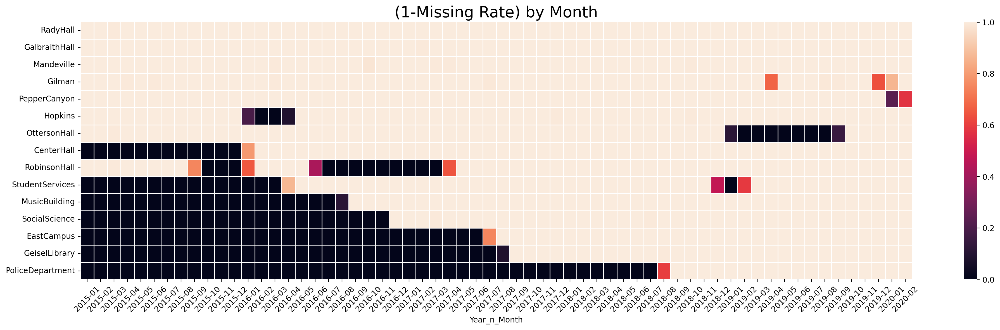

In [61]:
plt.figure(dpi=200,figsize=[24,6])
sns.heatmap(data=sorted_df.drop(columns=['Sum']),linewidths=1)
plt.title('(1-Missing Rate) by Month',fontsize=20)
plt.xticks(rotation=45)
plt.yticks(rotation=0)

# Following cells are debuging process

In [41]:
import re
i='BLD_CenterHall.csv'

splited_i=re.split(r'(_|\.)',i)
splited_i[2]

'CenterHall'

In [16]:
dataframes=[]
for i in fn_list_bld:
    fn=src_path+'\\'+i
    df=pd.read_csv(fn)
    df['DateTime']=pd.to_datetime(df['DateTime'])
    dataframes.append(df)
dataframes[2]

,DateTime,RealPower,ReactivePower
0,2020-02-29 23:45:00,228.681,67.887
1,2020-02-29 23:30:00,248.484,66.885
2,2020-02-29 23:15:00,250.369,65.377
3,2020-02-29 23:00:00,244.373,68.020
4,2020-02-29 22:45:00,238.299,68.699
...,...,...,...
181040,2015-01-01 01:00:00,124.188,75.482
181041,2015-01-01 00:45:00,125.511,76.362
181042,2015-01-01 00:30:00,124.981,75.090
181043,2015-01-01 00:15:00,125.890,76.289


In [17]:
common_datetime=set(dataframes[0]['DateTime'])
for df in dataframes[1:]:
    common_datetime=common_datetime.intersection(df["DateTime"])

In [18]:
common_datetime

{Timestamp('2019-11-01 17:15:00'),
 Timestamp('2019-12-15 20:30:00'),
 Timestamp('2019-11-09 15:30:00'),
 Timestamp('2019-11-09 23:30:00'),
 Timestamp('2020-02-22 21:30:00'),
 Timestamp('2019-11-02 12:45:00'),
 Timestamp('2018-10-27 08:00:00'),
 Timestamp('2018-11-26 17:00:00'),
 Timestamp('2020-02-13 11:30:00'),
 Timestamp('2020-02-24 16:15:00'),
 Timestamp('2018-11-02 18:30:00'),
 Timestamp('2020-02-16 23:15:00'),
 Timestamp('2019-11-04 19:45:00'),
 Timestamp('2018-09-11 06:30:00'),
 Timestamp('2019-11-17 05:15:00'),
 Timestamp('2018-10-19 06:45:00'),
 Timestamp('2019-11-29 02:45:00'),
 Timestamp('2018-11-11 08:45:00'),
 Timestamp('2018-11-30 15:00:00'),
 Timestamp('2018-10-11 01:15:00'),
 Timestamp('2018-09-19 05:30:00'),
 Timestamp('2020-02-23 23:00:00'),
 Timestamp('2019-10-27 14:45:00'),
 Timestamp('2018-12-10 05:15:00'),
 Timestamp('2019-09-27 13:45:00'),
 Timestamp('2020-01-06 19:15:00'),
 Timestamp('2018-11-21 17:15:00'),
 Timestamp('2018-09-16 09:45:00'),
 Timestamp('2018-12-

In [19]:
i=0
for df in dataframes:
    print('-'*10+str(i)+'-'*10)
    print(df.info())
    i=i+1

----------0----------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 145393 entries, 0 to 145392
Data columns (total 3 columns):
 #   Column         Non-Null Count   Dtype         
---  ------         --------------   -----         
 0   DateTime       145393 non-null  datetime64[ns]
 1   RealPower      145393 non-null  float64       
 2   ReactivePower  145393 non-null  float64       
dtypes: datetime64[ns](1), float64(2)
memory usage: 3.3 MB
None
----------1----------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 92757 entries, 0 to 92756
Data columns (total 3 columns):
 #   Column         Non-Null Count  Dtype         
---  ------         --------------  -----         
 0   DateTime       92757 non-null  datetime64[ns]
 1   RealPower      92757 non-null  float64       
 2   ReactivePower  92757 non-null  float64       
dtypes: datetime64[ns](1), float64(2)
memory usage: 2.1 MB
None
----------2----------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 181045 entries, 0 to 18

In [28]:
combined_df=pd.DataFrame(columns=['DateTime','RealPower'])

# Iterate over the common datetime index
for dt in common_datetime:
    data_sum = 0
    for df in dataframes:
        row = df[df['DateTime'] == dt]
        if not row.empty:
            data_sum += row['RealPower'].values[0]
    data={'DateTime': [dt], 'RealPower': [data_sum]}
    add_row=pd.DataFrame(data=data)
    # Add the combined row to the new dataframe
    combined_df = pd.concat([combined_df,add_row], ignore_index=True)


In [31]:
combined_df.sort_values(by=["DateTime"],ignore_index=True)

,DateTime,RealPower
0,2018-08-13 12:30:00,2275.343
1,2018-08-13 12:45:00,2272.701
2,2018-08-13 13:00:00,2268.962
3,2018-08-13 13:15:00,2300.863
4,2018-08-13 13:30:00,2290.396
...,...,...
21961,2020-02-29 22:45:00,1572.265
21962,2020-02-29 23:00:00,1588.584
21963,2020-02-29 23:15:00,1529.253
21964,2020-02-29 23:30:00,1494.143


In [32]:
combined_df.to_csv("../data/UCSD_raw_data/BLD_ALL.csv",index=False)

In [50]:
def intersection_sum(fn_list,src_path,key,save_fn):
    #read all csv files in the list as a list of dataframe
    dataframes=[]
    for i in fn_list[:2]:
        fn=src_path+'\\'+i
        df=pd.read_csv(fn)
        #turn the datetime row into type(DateTime)
        df['DateTime']=pd.to_datetime(df['DateTime'])
        dataframes.append(df)
    print(dataframes[0])
    
    #get intersection of datetime of all sub dataframes
    common_datetime=set(dataframes[0]['DateTime'])
    for df in dataframes[1:]:
        common_datetime=common_datetime.intersection(df["DateTime"])
    print(common_datetime)
    
    #Create a new empty dataframe   
    combined_df=pd.DataFrame(columns=['DateTime','RealPower'])
    print("process notification")
    #Iterate over the common datetime index
    for dt in common_datetime:
        data_sum = 0
        for df in dataframes:
            row = df[df['DateTime'] == dt]
            if not row.empty:
                data_sum += row['RealPower'].values[0]
        data={'DateTime': [dt], 'RealPower': [data_sum]}
        add_row=pd.DataFrame(data=data)
        # Add the combined row to the new dataframe
        print("process notification")
        combined_df = pd.concat([combined_df,add_row], ignore_index=True)
    print("process notification")
    combined_df.sort_values(by=["DateTime"],ignore_index=True)
    combined_df.to_csv(save_fn,index=False)



In [46]:
fn_list_pv

['PV_BSB_Building.csv',
 'PV_BSB_Library.csv',
 'PV_CSC_Building.csv',
 'PV_CUP.csv',
 'PV_EBU2_A.csv',
 'PV_EBU2_B.csv',
 'PV_ElectricShop.csv',
 'PV_GarageFleets.csv',
 'PV_Gilman.csv',
 'PV_Hopkins.csv',
 'PV_KeelingA.csv',
 'PV_KeelingB.csv',
 'PV_KyoceraSkyline.csv',
 'PV_Leichtag.csv',
 'PV_MayerHall.csv',
 'PV_MESOM.csv',
 'PV_OslerParking.csv',
 'PV_Powell.csv',
 'PV_PriceCenterA.csv',
 'PV_PriceCenterB.csv',
 'PV_SDSC.csv',
 'PV_SME_Solar.csv',
 'PV_StephenBirch.csv']

In [51]:
intersection_sum(fn_list_pv,src_path,"RealPower","../data/UCSD_raw_data/PV_ALL.csv")

                  DateTime  RealPower
0      2018-05-26 23:45:00      0.000
1      2018-05-26 23:30:00      0.000
2      2018-05-26 23:15:00      0.000
3      2018-05-26 23:00:00      0.000
4      2018-05-26 22:45:00      0.000
...                    ...        ...
117299 2015-01-21 01:00:00      0.005
117300 2015-01-21 00:45:00      0.005
117301 2015-01-21 00:30:00      0.006
117302 2015-01-21 00:15:00      0.008
117303 2015-01-21 00:00:00      0.004

[117304 rows x 2 columns]
{Timestamp('2016-05-21 00:00:00'), Timestamp('2015-02-25 18:30:00'), Timestamp('2015-07-07 18:00:00'), Timestamp('2016-11-23 22:00:00'), Timestamp('2015-03-01 06:30:00'), Timestamp('2015-07-07 15:15:00'), Timestamp('2016-11-04 11:00:00'), Timestamp('2017-08-19 18:30:00'), Timestamp('2017-06-26 14:45:00'), Timestamp('2017-03-05 08:00:00'), Timestamp('2015-05-14 20:45:00'), Timestamp('2015-08-19 20:15:00'), Timestamp('2018-04-17 21:15:00'), Timestamp('2018-01-29 01:30:00'), Timestamp('2015-10-19 08:15:00'), Timest